In [1]:
import requests
import json

In [2]:
import geocoder
from geopy.geocoders import Nominatim

import requests
import json

url = "http://httpbin.org/ip"  # 也可以直接在浏览器访问这个地址
r = requests.get(url)  # 获取返回的值
ip = json.loads(r.text)["origin"]  # 取其中某个字段的值
print(f"当前ip: {ip}")

# 获取当前设备的IP地址
g = geocoder.ip(ip)

# 获取当前设备的经纬度坐标
latitude, longitude = g.latlng
# 打印结果
print(f"当前位置经度: {latitude}")
print(f"当前位置纬度: {longitude}")


当前ip: 2.58.86.225
当前位置经度: 34.0522
当前位置纬度: -118.2437


In [3]:
import pandas as pd
import requests
import time
import csv
import json

In [4]:
def gaode(addr):
        para = {
            'key':'bff294f3fd631c85a1d607798754d4c4',  #高德地图开放平台申请的key
            'address':addr #传入地址参数
        }
        url = 'https://restapi.amap.com/v3/geocode/geo?' #高德地图API接口
        req = requests.get(url,para)
        req = req.json()
        print('-' * 30)
        m = req['geocodes'][0]['location']
        print(addr)
        print(m)
        return m
gaode(addr="南方科技大学")

------------------------------
南方科技大学
113.987724,22.593590


'113.987724,22.593590'

In [5]:
import geopandas as gpd
import osmnx as ox

%matplotlib inline
ox.__version__

'1.3.0'

In [6]:
location_point = gaode(addr="北京")
location_point


------------------------------
北京
116.407526,39.904030


'116.407526,39.904030'

In [7]:
def str_to_tuple(s):
    a, b = s.split(',')
    return tuple([float(b), float(a)])

In [8]:
str_to_tuple(location_point)

(39.90403, 116.407526)

In [9]:
location_point = (34.0522,-118.2437)

In [10]:
#location_point = (39.904030,116.407526)
# same point again, but create network only of nodes within 500m along the network from point
G = ox.graph_from_point(location_point, dist=500, dist_type="bbox", network_type="drive")

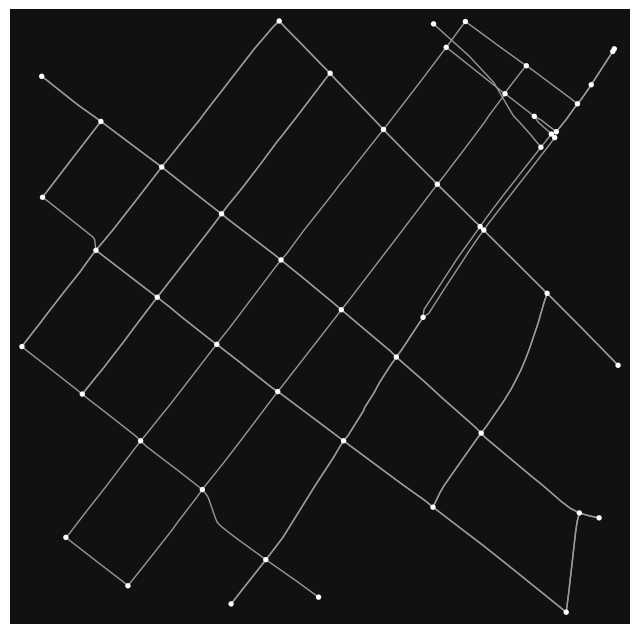

In [11]:
fig, ax = ox.plot_graph(G)

In [12]:
# plot the route with folium
ox.plot_graph_folium(G ,tiles='openstreetmap', popup_attribute='name',opacity=0.1)

In [13]:
import matplotlib.pyplot as plt
import folium
%matplotlib inline

In [14]:
def query(addre):
    location_point = gaode(addr=addre)
    location_point = str_to_tuple(location_point)
    G = ox.graph_from_point(location_point, dist=2500, dist_type="bbox", network_type="drive")    
    fig, ax = ox.plot_graph(G)
    ad = ox.plot_graph_folium(G ,tiles='openstreetmap', popup_attribute='name',opacity=0.01)
    marker = folium.Marker(location=list(location_point))
    marker.add_to(ad)
    return ad

In [15]:
def query1(addre):
    location_point = gaode(addr=addre)
    location_point = str_to_tuple(location_point)
    G = ox.graph_from_point(location_point, dist=2500, dist_type="bbox", network_type="drive")    
    m = folium.Map(location=[location_point[0], location_point[1]], zoom_start=14, tiles='cartodbpositron')
    ad = ox.plot_graph_folium(G, graph_map=m, edge_color='red', edge_width=2, edge_opacity=0.01)
    return ad

In [53]:
gaode(addr="深圳北站")

------------------------------
深圳北站
114.028356,22.607177


'114.028356,22.607177'

------------------------------
深圳北站
114.028356,22.607177


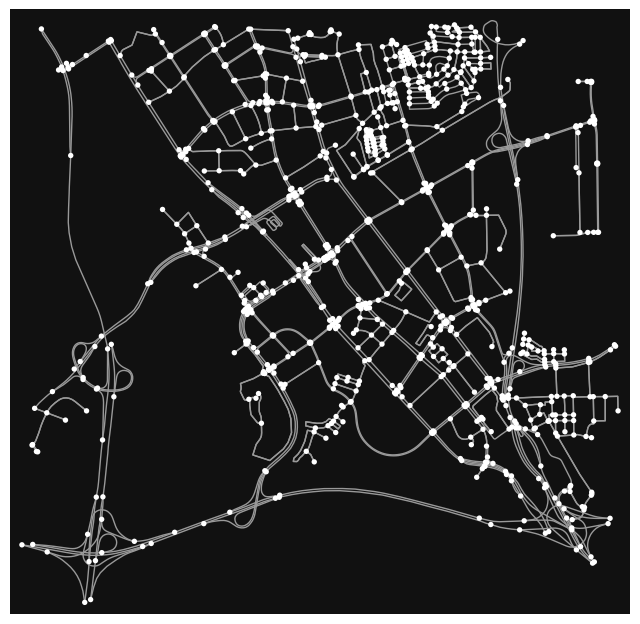

In [51]:
query("深圳北站")

In [18]:
def local_position():
    url = "http://httpbin.org/ip"  # 也可以直接在浏览器访问这个地址
    r = requests.get(url)  # 获取返回的值
    ip = json.loads(r.text)["origin"]  # 取其中某个字段的值
    print(f"当前ip: {ip}")

    # 获取当前设备的IP地址
    g = geocoder.ip(ip)

    # 获取当前设备的经纬度坐标
    latitude, longitude = g.latlng
    # 打印结果
    print(f"当前位置经度: {latitude}")
    print(f"当前位置纬度: {longitude}")
    return (latitude,longitude)


In [19]:
a = local_position()
a[0]

当前ip: 45.12.82.13
当前位置经度: 47.6062
当前位置纬度: -122.3321


47.6062

In [20]:
def find_path(destination):
    destination_point = gaode(addr=destination)
    destination_point = str_to_tuple(destination_point)
    your_position = local_position()
    G = ox.graph_from_point(destination_point, dist=2500, dist_type="bbox", network_type="drive")
    start_node = ox.distance.nearest_nodes(G, your_position[0], your_position[1])
    destination_node = ox.distance.nearest_nodes(G, destination_point[0], destination_point[1])
    ad = ox.plot_graph_folium(G ,tiles='openstreetmap', popup_attribute='name',opacity=0.01)
    marker = folium.Marker(location=list(destination_point))
    marker.add_to(ad)
    marker1 = folium.Marker(location=list(your_position))
    marker1.add_to(ad)
    return ad

In [21]:
find_path("深圳大学西丽校区")

------------------------------
深圳大学西丽校区
113.939428,22.528159
当前ip: 89.116.144.225
当前位置经度: 34.0522
当前位置纬度: -118.2437


In [22]:
def find_path2(start,destination):    
    start_point = gaode(addr=start)
    start_point = str_to_tuple(start_point)
    destination_point = gaode(addr=destination)
    destination_point = str_to_tuple(destination_point)
    G = ox.graph_from_point(destination_point, dist=2500, dist_type="bbox", network_type="drive")
    start_node = ox.distance.nearest_nodes(G, start_point[0], start_point[1])
    destination_node = ox.distance.nearest_nodes(G, destination_point[0], destination_point[1])
    route = ox.shortest_path(G, start_node, destination_node, weight="length")
    
    ad = ox.plot_graph_folium(G ,tiles='openstreetmap', popup_attribute='name',opacity=0.01)
    
    marker = folium.Marker(location=list(destination_point))
    marker.add_to(ad)
    marker1 = folium.Marker(location=list(start_point),icon=folium.Icon(color='red'))
    marker1.add_to(ad)
    return ad

In [23]:
find_path2("南方科技大学","宝能城")

------------------------------
南方科技大学
113.987724,22.593590
------------------------------
宝能城
113.999580,22.590580


In [24]:
def find_path1(start,destination):    
    start_point = gaode(addr=start)
    start_point = str_to_tuple(start_point)
    destination_point = gaode(addr=destination)
    destination_point = str_to_tuple(destination_point)
    G = ox.graph_from_point(destination_point, dist=8500, dist_type="bbox", network_type="drive")
    start_node = ox.distance.nearest_nodes(G, start_point[1], start_point[0])
    destination_node = ox.distance.nearest_nodes(G, destination_point[1], destination_point[0])
    route = ox.shortest_path(G, start_node, destination_node)
    ad = ox.plot_route_folium(G, route, route_width=3,tiles='openstreetmap', popup_attribute='name')   
    marker = folium.Marker(location=list(destination_point))
    marker.add_to(ad)
    marker1 = folium.Marker(location=list(start_point),icon=folium.Icon(color='red'))
    marker1.add_to(ad)
    return ad

In [25]:
find_path1("南方科技大学","深圳大学")

------------------------------
南方科技大学
113.987724,22.593590
------------------------------
深圳大学
113.935097,22.527939


In [26]:
import networkx as nx

In [31]:
start = "南方科技大学"
destination = "深圳大学"
start_point = gaode(addr=start)
start_point = str_to_tuple(start_point)
destination_point = gaode(addr=destination)
destination_point = str_to_tuple(destination_point)
G = ox.graph_from_point(start_point, dist=3500, dist_type="bbox", network_type="drive")
start_node = ox.distance.nearest_nodes(G, start_point[1], start_point[0])
destination_node = ox.distance.nearest_nodes(G, destination_point[1], destination_point[0])
print(start_node, destination_node)
route = ox.shortest_path(G, start_node, destination_node)

ad = ox.plot_route_folium(G, route, route_width=3,tiles='openstreetmap', popup_attribute='name')

marker = folium.Marker(location=list(destination_point))
marker.add_to(ad)
marker1 = folium.Marker(location=list(start_point),icon=folium.Icon(color='red'))
marker1.add_to(ad)

------------------------------
南方科技大学
113.987724,22.593590
------------------------------
深圳大学
113.935097,22.527939
5240883420 2364897515


In [32]:
ad

In [34]:
def find_path3(start,destination,network_type):    
    start_point = gaode(addr=start)
    start_point = str_to_tuple(start_point)
    destination_point = gaode(addr=destination)
    destination_point = str_to_tuple(destination_point)
    G = ox.graph_from_point(destination_point, dist=8500, dist_type="bbox", network_type = network_type)
    start_node = ox.distance.nearest_nodes(G, start_point[1], start_point[0])
    destination_node = ox.distance.nearest_nodes(G, destination_point[1], destination_point[0])
    
    route2 = ox.shortest_path(G, start_node, destination_node, weight='length')
    route3 = ox.shortest_path(G, start_node, destination_node, weight='travel_time')

    route_map = ox.plot_route_folium(G, route2, color="red", weight=5, opacity=0.5 ,alpha=0.5,tiles='openstreetmap', popup_attribute='name')
    route_map = ox.plot_route_folium(G, route3, route_map=route_map, color="blue", alpha=0.5,weight=5, opacity=0.5,tiles='openstreetmap', popup_attribute='name')

    marker = folium.Marker(location=list(destination_point))
    marker.add_to(route_map)
    marker1 = folium.Marker(location=list(start_point),icon=folium.Icon(color='red'))
    marker1.add_to(route_map)
    return route_map

In [35]:
find_path3("南方科技大学","深圳大学","walk")

------------------------------
南方科技大学
113.987724,22.593590
------------------------------
深圳大学
113.935097,22.527939


In [37]:
find_path3("南方科技大学","深圳大学","drive")

------------------------------
南方科技大学
113.987724,22.593590
------------------------------
深圳大学
113.935097,22.527939


In [46]:
start = "南方科技大学"
destination = "深圳大学"
network_type = "bike"
start_point = gaode(addr=start)
start_point = str_to_tuple(start_point)
destination_point = gaode(addr=destination)
destination_point = str_to_tuple(destination_point)
G = ox.graph_from_point(destination_point, dist=8500, dist_type="bbox", network_type = network_type)
start_node = ox.distance.nearest_nodes(G, start_point[1], start_point[0])
destination_node = ox.distance.nearest_nodes(G, destination_point[1], destination_point[0])

route2 = ox.shortest_path(G, start_node, destination_node, weight='length')
route3 = ox.shortest_path(G, start_node, destination_node, weight='travel_time')

route_map = ox.plot_route_folium(G, route2, color="red", weight=5, opacity=0.5 ,alpha=0.5,tiles='openstreetmap', popup_attribute='name')
route_map = ox.plot_route_folium(G, route3, route_map=route_map, color="blue", alpha=0.5,weight=5, opacity=0.5,tiles='openstreetmap', popup_attribute='name')

marker = folium.Marker(location=list(destination_point))
marker.add_to(route_map)
marker1 = folium.Marker(location=list(start_point),icon=folium.Icon(color='red'))
marker1.add_to(route_map)
route_map.save('route_bike.html')

------------------------------
南方科技大学
113.987724,22.593590
------------------------------
深圳大学
113.935097,22.527939


In [47]:
route_map

In [48]:
gdf_nodes, gdf_edges = ox.graph_to_gdfs(G)

In [49]:
gdf_edges

osmid bridge  oneway  name  \
u           v           key                                                  
267602507   2401176953  0                   231787772    yes    True  宝安大道   
267602518   2457761634  0                   165265378    NaN    True   NaN   
267602574   2420580046  0                   233713929    NaN    True   南新路   
            2420580030  0                   689220805    NaN   False   学府路   
            9197027678  0                  1055022192    NaN    True   学府路   
...                                               ...    ...     ...   ...   
10775346956 9263331630  0                   989327551    NaN   False   NaN   
            10775346956 0                  1158676431    NaN    True   NaN   
10779087821 2561225193  0     [581971314, 1159095443]    NaN   False  绿坪一路   
10784019107 9263331632  0    [1159614061, 1003916183]    NaN   False   NaN   
10784019108 10775340196 0                  1159614063    NaN   False   NaN   

                                             highway reversed   length  \
u           v           key                                              
267602507   2401176953  0                    primary    False  113.850   
267602518   2457761634  0                  secondary    False  110.792   
267602574   2420580046  0                  secondary    False   62.720   
            2420580030  0                  secondary     True   12.216   
            9197027678  0                  secondary    False  143.370   
...                                              ...      ...      ...   
10775346956 9263331630  0                    service     True  126.201   
            10775346956 0                    service    False   50.105   
10779087821 2561225193  0    [unclassified, service]     True  312.383   
10784019107 9263331632  0                    service    False  120.952   
10784019108 10775340196 0                    service    False   43.782   

                                                                      geometry  \
u           v           key                                                      
267602507   2401176953  0    LINESTRING (113.90526 22.54462, 113.90507 22.5...   
267602518   2457761634  0    LINESTRING (113.90436 22.54537, 113.90439 22.5...   
267602574   2420580046  0    LINESTRING (113.91361 22.53119, 113.91381 22.5...   
            2420580030  0    LINESTRING (113.91361 22.53119, 113.91373 22.5...   
            9197027678  0    LINESTRING (113.91361 22.53119, 113.91341 22.5...   
...                                                                        ...   
10775346956 9263331630  0    LINESTRING (113.93072 22.57427, 113.93137 22.5...   
            10775346956 0    LINESTRING (113.93072 22.57427, 113.93061 22.5...   
10779087821 2561225193  0    LINESTRING (113.99657 22.59047, 113.99648 22.5...   
10784019107 9263331632  0    LINESTRING (113.93202 22.57394, 113.93261 22.5...   
10784019108 10775340196 0    LINESTRING (113.93131 22.57221, 113.93174 22.5...   

                              ref lanes maxspeed tunnel           service  \
u           v           key                                                 
267602507   2401176953  0     NaN   NaN      NaN    NaN               NaN   
267602518   2457761634  0     NaN   NaN      NaN    NaN               NaN   
267602574   2420580046  0    Y037   NaN      NaN    NaN               NaN   
            2420580030  0     NaN   NaN      NaN    NaN               NaN   
            9197027678  0     NaN     2      NaN    NaN               NaN   
...                           ...   ...      ...    ...               ...   
10775346956 9263331630  0     NaN     1      NaN    NaN     parking_aisle   
            10775346956 0     NaN     1      NaN    NaN     parking_aisle   
10779087821 2561225193  0     NaN   NaN      NaN    NaN               NaN   
10784019107 9263331632  0     NaN   NaN      NaN    NaN  emergency_access   
10784019108 10775340196 0     NaN   NaN      NaN    NaN               NaN   

 

In [34]:
a = pd.DataFrame(gdf_edges["highway"])

In [35]:
a[a["highway"] == "railway"]

,,,highway
u,v,key,


In [36]:
gdf_edges["highway"].value_counts()

residential                             5197
tertiary                                3578
secondary                               3454
unclassified                            2269
primary                                 2100
primary_link                             762
secondary_link                           431
living_street                            249
trunk_link                               170
trunk                                    159
motorway_link                            110
tertiary_link                            104
motorway                                  33
[tertiary, unclassified]                  14
[tertiary, residential]                   13
road                                      12
[unclassified, residential]               10
[residential, unclassified]               10
[living_street, residential]               7
[secondary, primary]                       7
[primary_link, primary]                    7
[tertiary, secondary]                      6
[secondary

In [48]:
G = ox.graph_from_place('南山区,深圳市,中国', retain_all=False , truncate_by_edge=True, custom_filter = '["railway"~"tram|rail"]')

In [40]:
G = ox.graph_from_place('南山区,深圳市,中国', retain_all=False , truncate_by_edge=True, custom_filter='["railway"~"rail|light_rail|narrow_gauge|subway"]')

In [51]:
start = "南方科技大学"
destination = "深圳北站"
start_point = gaode(addr=start)
start_point = str_to_tuple(start_point)
destination_point = gaode(addr=destination)
destination_point = str_to_tuple(destination_point)
start_node = ox.distance.nearest_nodes(G, start_point[1], start_point[0])
destination_node = ox.distance.nearest_nodes(G, destination_point[1], destination_point[0])

route2 = ox.shortest_path(G, start_node, destination_node, weight='length')

route_map = ox.plot_route_folium(G, route2, color="red", weight=5, opacity=0.5 ,alpha=0.5,tiles='openstreetmap', popup_attribute='name')

marker = folium.Marker(location=list(destination_point))
marker.add_to(route_map)
marker1 = folium.Marker(location=list(start_point),icon=folium.Icon(color='red'))
marker1.add_to(route_map)

------------------------------
南方科技大学
113.987724,22.593590
------------------------------
深圳北站
114.028356,22.607177


In [52]:
route_map